<a href="https://colab.research.google.com/github/emmanuelwanyama/INTERNSHIP_2023/blob/main/Recess_Wanyama_Project_UG_Genomic_surveillance_exploratory_data_analysis_(3).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![banner](https://github.com/anopheles-genomic-surveillance/anopheles-genomic-surveillance.github.io/blob/master/docs/banner.jpg?raw=1)

***[Workshop 8](about) - Planning analysis and presenting results***

---

# Module 1 - Planning a genomic surveillance exploratory data analysis

**Theme: Analysis**

This module will provide a walk-through guide to the necessary steps to plan and perform a genomic surveillance exploratory data analysis, and to distil the outputs into key findings.

To achieve this, we will revisit the analyses explored in previous workshops.

## Learning objectives

After completing this module, you will be able to:

* Define exploratory analysis
* Create an exploratory data analysis plan
* Review analysis methods covered previously in the training course
* Identify key findings


## Lecture

### English

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/0oisjYc5wk4" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

---
## Exploratory data analysis plan
We have divided the analysis plan into 10 steps:

0. Background reading
1. Population sampling
2. Taxonomic population structure
3. Geographical population structure
4. Cohort choice
5. Genetic diversity
6. Insecticide resistance variant frequencies
7. Genome-wide selection scans
8. Adaptive gene flow
9. Review & refine key findings


We have covered all of these analyses previously, but not in the same order presented here, as we chose to teach some easier concepts first. The order here provides the steps in the natural order you would use to approach an analysis exercise.

Depending on the question(s) you are trying to answer you might focus more or less on certain sections described here.

In summary, you will:
* Prepare for the analysis by finding out relevant background information.
* Explore what mosquitoes have been sequences and how they are genetically related.
* Decide how to group mosquitoes into cohorts for comparisons.
* Analyse and compare the mosquito cohorts.
* Synthesise and interpret the results.
---

## Well done!

In this module we have learnt how to:
- Plan and conduct a genomic surveillance exploratory data analysis
- Distil the outputs into key findings

## Practical exercises

### English

Now, you can run your own exploratory data analysis. For this:

1. Choose a country or set of neighbourhing countries to focus on.
1. Run all the analyses we explored in the order they have been outlined in the exploratory data analysis plan.
1. Identify a maximum of 10 key findings.

**Remember:**
- You can  use your own data to perform the exercises on (check assumptions above if these data is not part of the MalariaGEN vector observatory).
- You can use data from other studies in the MalariaGEN vector observatory data to conduct your exploratory data analysis on. These data are open-access but subject to a publication embargo. This means that you will need to **obtain permission before publicly communicating any findings**.



# Exploratory Data Analysis for the Ugandan Anopheles mosquitoes

### Installation of the `malariagen_data`, `ipyleaflet` packages

In [ ]:
!pip install -q --no-warn-conflicts malariagen_data

# Install ipyleaflet package
!pip install -qq ipyleaflet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.2/133.2 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.5/302.5 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 55.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.9/139.9 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 81.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.9/206.9 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 22.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 100.6 MB/s eta 0:00

### Loading of packages and setting up access to the malaria_gen data

In [ ]:
import malariagen_data
import ipyleaflet
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
import bokeh.io as bkio
bkio.output_notebook()
import allel

# set up access to the data
ag3 = malariagen_data.Ag3()
ag3

<MalariaGEN Ag3 API client>
Storage URL             : gs://vo_agam_release/
Data releases available : 3.0
Results cache           : None
Cohorts analysis        : 20230516
AIM analysis            : 20220528
Site filters analysis   : dt_20200416
Software version        : malariagen_data 7.13.0
Client location         : South Carolina, US
---
Please note that data are subject to terms of use,
for more information see https://www.malariagen.net/data
or contact data@malariagen.net. For API documentation see 
https://malariagen.github.io/vector-data/ag3/api.html

## Step 1 - Population sampling

For this analysis, we shall include samples collected from Uganda and available in the `ag3 release 3.0` dataset. We will select Ugandan dataset using the `ag3.sample_metadata` and `ag3.sample_sets` parameters of the `malariagen_data` package.
We will also utilize the `pandas_df.query` parameter to select metadata for the Ugandan samples.

### Loading sample meta data

In [ ]:
#  Load sample metadata
df_samples = ag3.sample_metadata()
df_samples

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,admin1_name,admin1_iso,admin2_name,taxon,cohort_admin1_year,cohort_admin1_month,cohort_admin1_quarter,cohort_admin2_year,cohort_admin2_month,cohort_admin2_quarter
0,AR0047-C,LUA047,Joao Pinto,Angola,Luanda,2009,4,-8.884,13.302,F,...,Luanda,AO-LUA,Luanda,coluzzii,AO-LUA_colu_2009,AO-LUA_colu_2009_04,AO-LUA_colu_2009_Q2,AO-LUA_Luanda_colu_2009,AO-LUA_Luanda_colu_2009_04,AO-LUA_Luanda_colu_2009_Q2
1,AR0049-C,LUA049,Joao Pinto,Angola,Luanda,2009,4,-8.884,13.302,F,...,Luanda,AO-LUA,Luanda,coluzzii,AO-LUA_colu_2009,AO-LUA_colu_2009_04,AO-LUA_colu_2009_Q2,AO-LUA_Luanda_colu_2009,AO-LUA_Luanda_colu_2009_04,AO-LUA_Luanda_colu_2009_Q2
2,AR0051-C,LUA051,Joao Pinto,Angola,Luanda,2009,4,-8.884,13.302,F,...,Luanda,AO-LUA,Luanda,coluzzii,AO-LUA_colu_2009,AO-LUA_colu_2009_04,AO-LUA_colu_2009_Q2,AO-LUA_Luanda_colu_2009,AO-LUA_Luanda_colu_2009_04,AO-LUA_Luanda_colu_2009_Q2
3,AR0061-C,LUA061,Joao Pinto,Angola,Luanda,2009,4,-8.884,13.302,F,...,Luanda,AO-LUA,Luanda,coluzzii,AO-LUA_colu_2009,AO-LUA_colu_2009_04,AO-LUA_colu_2009_Q2,AO-LUA_Luanda_colu_2009,AO-LUA_Luanda_colu_2009_04,AO-LUA_Luanda_colu_2009_Q2
4,AR0078-C,LUA078,Joao Pinto,Angola,Luanda,2009,4,-8.884,13.302,F,...,Luanda,AO-LUA,Luanda,coluzzii,AO-LUA_colu_2009,AO-LUA_colu_2009_04,AO-LUA_colu_2009_Q2,AO-LUA_Luanda_colu_2009,AO-LUA_Luanda_colu_2009_04,AO-LUA_Luanda_colu_2009_Q2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3076,AD0494-C,80-2-o-16,Martin Donnelly,Lab Cross,LSTM,-1,-1,53.409,-2.969,F,...,NaN,NaN,NaN,unassigned,NaN,NaN,NaN,NaN,NaN,NaN
3077,AD0495-C,80-2-o-17,Martin Donnelly,Lab Cross,LSTM,-1,-1,53.409,-2.969,M,...,NaN,NaN,NaN,unassigned,NaN,NaN,NaN,NaN,NaN,NaN
3078,AD0496-C,80-2-o-18,Martin Donnelly,Lab Cross,LSTM,-1,-1,53.409,-2.969,M,...,NaN,NaN,NaN,unassigned,NaN,NaN,NaN,NaN,NaN,NaN
3079,AD0497-C,80-2-o-19,Martin Donnelly,Lab Cross,LSTM,-1,-1,53.409,-2.969,F,...,NaN,NaN,NaN,unassigned,NaN,NaN,NaN,NaN,NaN,NaN


### Selecting data from Uganda

In [ ]:
df_Uganda = df_samples.query("country == 'Uganda'")
df_Uganda

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,admin1_name,admin1_iso,admin2_name,taxon,cohort_admin1_year,cohort_admin1_month,cohort_admin1_quarter,cohort_admin2_year,cohort_admin2_month,cohort_admin2_quarter
2494,AC0007-C,1_A2,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
2495,AC0008-C,1_A6,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
2496,AC0009-Cx,1_A7,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
2497,AC0010-C,1_A9,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
2498,AC0011-C,1_B5,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2779,AC0295-C,K92,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,Western Region,UG-W,Kanungu,gambiae,UG-W_gamb_2012,UG-W_gamb_2012_11,UG-W_gamb_2012_Q4,UG-W_Kanungu_gamb_2012,UG-W_Kanungu_gamb_2012_11,UG-W_Kanungu_gamb_2012_Q4
2780,AC0296-C,K93,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,Western Region,UG-W,Kanungu,gambiae,UG-W_gamb_2012,UG-W_gamb_2012_11,UG-W_gamb_2012_Q4,UG-W_Kanungu_gamb_2012,UG-W_Kanungu_gamb_2012_11,UG-W_Kanungu_gamb_2012_Q4
2781,AC0297-C,K94,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,Western Region,UG-W,Kanungu,gambiae,UG-W_gamb_2012,UG-W_gamb_2012_11,UG-W_gamb_2012_Q4,UG-W_Kanungu_gamb_2012,UG-W_Kanungu_gamb_2012_11,UG-W_Kanungu_gamb_2012_Q4
2782,AC0298-C,K95,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,Western Region,UG-W,Kanungu,gambiae,UG-W_gamb_2012,UG-W_gamb_2012_11,UG-W_gamb_2012_Q4,UG-W_Kanungu_gamb_2012,UG-W_Kanungu_gamb_2012_11,UG-W_Kanungu_gamb_2012_Q4


- There were 290 mosquito samples from Uganda

### Number of samples per site
- 194 samples from Nangongera (Tororo) and 96 from Kihihi (Kanungu), found in eastern and western Uganda respectively

In [ ]:
df_Uganda.groupby(['admin1_name', 'admin2_name', 'location']).size()


admin1_name     admin2_name  location 
Eastern Region  Tororo       Nagongera    194
Western Region  Kanungu      Kihihi        96
dtype: int64

In [ ]:
Ug_samples_per_site = (
    df_Uganda.pivot_table(
        index=['country', 'year', 'admin2_name', 'location'],
        values="sample_id",
        aggfunc="count",
        fill_value=0))
Ug_samples_per_site

sample_id
country year admin2_name location            
Uganda  2012 Kanungu     Kihihi            96
             Tororo      Nagongera        194

### Taxons in the dataset

#### a) Using Pivot tables

In [ ]:
df_Uganda['taxon'].value_counts()

gambiae       207
arabiensis     82
unassigned      1
Name: taxon, dtype: int64

In [ ]:
# Number of mosquitoes by site and species
Ug_taxon_pivot = (
    df_Uganda.pivot_table(
        index=['country', 'year', 'admin2_name', 'location'],
        columns="taxon",
        values="sample_id",
        aggfunc="count",
        fill_value=0))
Ug_taxon_pivot

taxon                               arabiensis  gambiae  unassigned
country year admin2_name location                                  
Uganda  2012 Kanungu     Kihihi              1       95           0
             Tororo      Nagongera          81      112           1

In [ ]:
df_Uganda.groupby(['year', 'admin2_name', 'location', 'taxon']).size()

year  admin2_name  location   taxon     
2012  Kanungu      Kihihi     arabiensis      1
                              gambiae        95
      Tororo       Nagongera  arabiensis     81
                              gambiae       112
                              unassigned      1
dtype: int64

- All Ugandan samples in the `ag3 release 3.0` were collected in 2012, from 2 sites, Nagongera (in Tororo, eastern Uganda) and Kihihi (in Kanungu, western Uganda).
- Only 2 species An. gambiae and An. arabiensis.

#### b) Using a bar plot/chart

In [ ]:
# Number of mosquitoes by site and species
Ug_taxon_pivot2 = (
    df_Uganda.pivot_table(
        index= 'location',
        columns="taxon",
        values="sample_id",
        aggfunc="count",
        fill_value=0))
Ug_taxon_pivot2

taxon,arabiensis,gambiae,unassigned
location,,,
Kihihi,1,95,0
Nagongera,81,112,1


In [ ]:
# Number of samples per country by species as Bar chart
bar_plot_ug = px.bar(Ug_taxon_pivot2, height=600, width=800)
bar_plot_ug.update_layout(
    title="Number of samples per site per taxon in Uganda",
    yaxis_title="no. samples/genomes",
)
bar_plot_ug

### Sampling locations plotted on a map

#### Install and load the `ipyleaflet` package

In [ ]:
# Install ipyleaflet package
!pip install -qq ipyleaflet

# Load the ipyleaflet package
import ipyleaflet

#### Create pivot table with locations and coordinates

In [ ]:
# create pivot table with locations
Ug_locations_pivot = (
    df_Uganda.pivot_table(
        index=["country", "location", "latitude", "longitude"],
        columns=["taxon"],
        values="sample_id",
        aggfunc="count",
        fill_value=0,))

Ug_locations_pivot

taxon                                 arabiensis  gambiae  unassigned
country location  latitude longitude                                 
Uganda  Kihihi    -0.751   29.701              1       95           0
        Nagongera  0.770   34.026             81      112           1

In [ ]:
# Uganda map with location markers
# create a map
Ug_map = ipyleaflet.Map(
    basemap=ipyleaflet.basemaps.OpenStreetMap.Mapnik,
    center=[1, 35],
    zoom=6,
)

# add markers for sampling locations
for row in Ug_locations_pivot.reset_index().itertuples():
    title = (
        f"{row.location}, {row.country} ({row.latitude:.3f}, {row.longitude:.3f})\n"
        f"{row.gambiae} gambiae, {row.arabiensis} arabiensis"
    )
    marker = ipyleaflet.Marker(
        location=(row.latitude, row.longitude),
        draggable=False,
        title=title,
    )
    Ug_map.add_layer(marker)

# add a scale bar
Ug_map.add_control(ipyleaflet.ScaleControl(position="bottomleft"))

# display the map
Ug_map

Map(center=[1, 35], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

- The above is an interactive map showing the sites of mosquito collections. Hovering over the location pin will display the site name, location coordinates and the number of mosquitoes collected by taxon.

### Ag3 Sample_sets
- There were 27 sample_sets in the `ag3 release '3.0'`. The Ugandan dataset was `AG1000G-UG`.

In [ ]:
ag3_samplesets = ag3.sample_sets(release='3.0')
ag3_samplesets.head()

,sample_set,sample_count,study_id,study_url,release
0,AG1000G-AO,81,AG1000G-AO,https://www.malariagen.net/network/where-we-wo...,3.0
1,AG1000G-BF-A,181,AG1000G-BF-1,https://www.malariagen.net/network/where-we-wo...,3.0
2,AG1000G-BF-B,102,AG1000G-BF-1,https://www.malariagen.net/network/where-we-wo...,3.0
3,AG1000G-BF-C,13,AG1000G-BF-2,https://www.malariagen.net/network/where-we-wo...,3.0
4,AG1000G-CD,76,AG1000G-CD,https://www.malariagen.net/network/where-we-wo...,3.0


In [ ]:
Ug_sample_set = ag3.sample_sets(release='3.0').query("sample_set == 'AG1000G-UG'")
Ug_sample_set

,sample_set,sample_count,study_id,study_url,release
26,AG1000G-UG,290,AG1000G-UG,https://www.malariagen.net/network/where-we-wo...,3.0


# Step 2 - Taxonomic population structure

### Taxons present in the Ugandan dataset

In [ ]:
# Number of mosquitoes by site and species
Ug_taxon_pivot2 = (
    df_Uganda.pivot_table(
        index= 'location',
        columns="taxon",
        values="sample_id",
        aggfunc="count",
        fill_value=0))
Ug_taxon_pivot2

taxon,arabiensis,gambiae,unassigned
location,,,
Kihihi,1,95,0
Nagongera,81,112,1


In [ ]:
# Number of samples per country by species as Bar chart
bar_plot_ug = px.bar(Ug_taxon_pivot2, height=600, width=800)
bar_plot_ug.update_layout(
    title="Number of samples per site per taxon in Uganda",
    yaxis_title="no. samples/genomes",
)
bar_plot_ug

### Ancestry Informative Marker (AIM) analysis
AIMs are a group of genotype markers that are used to completely distinguish species ancestry for each mosquito, detect gene flow between species and identify any cryptic species that were previously unknown.
There are 2 types of AIMs:
- gambcolu_vs_arab -- These are SNPs where An. arabiensis have a different allele from An. gambiae and An. coluzzii
- gamb_vs_colu -- These are SNPs where An. coluzzii have a different allele from An. gambiae.

For the case of uganda, we shall use the `gambcolu_vs_arab` AIMs since the only two species available in the dataset are An. gambiae and An. arabiensis.

In [ ]:
ag3.aim_ids

('gambcolu_vs_arab', 'gamb_vs_colu')

#### Accessing the AIM SNP data for Ugandan samples
- Using the `.aim_calls` parameter, as below.

In [ ]:
Ug_aims = ag3.aim_calls(aims="gambcolu_vs_arab", sample_sets="AG1000G-UG")
Ug_aims

<xarray.Dataset>
Dimensions:           (variants: 2612, samples: 290, ploidy: 2, alleles: 2)
Coordinates:
    sample_id         (samples) <U24 dask.array<chunksize=(290,), meta=np.ndarray>
    variant_contig    (variants) uint8 dask.array<chunksize=(2612,), meta=np.ndarray>
    variant_position  (variants) int32 dask.array<chunksize=(2612,), meta=np.ndarray>
Dimensions without coordinates: variants, samples, ploidy, alleles
Data variables:
    call_genotype     (variants, samples, ploidy) int8 dask.array<chunksize=(1306, 145, 2), meta=np.ndarray>
    variant_allele    (variants, alleles) |S1 dask.array<chunksize=(2612, 2), meta=np.ndarray>
Attributes:
    aims:      gambcolu_vs_arab
    analysis:  20220528
    contigs:   ['2R', '2L', '3R', '3L', 'X']

There are 2612 variants (AIM SNPs) in all the chromosomes for the 290 ugandan samples

#### Visualizing the AIMs for the Ugandan dataset
Using the `ag3.plot_aim_heatmap()` parameter, as below

In [ ]:
ag3.plot_aim_heatmap?

In [ ]:
Ug_aims_plot = ag3.plot_aim_heatmap(aims="gambcolu_vs_arab", sample_sets="AG1000G-UG")
Ug_aims_plot

There is a clear distinction between An. gambiae (gambcolu) in purple colour and An. arabiensis (arab) in green colour. Most of the AIMs are homozygous for the 2 known taxa. There is one hybrid mosquito (AC0198-C) that has SNPs from both An. gambiae and An. arabiensis.

#### AIMs summary and species assignment
  - `aim_species_fraction_arab` is the fraction of arabiensis alleles in genotypes at the gambcolu_vs_arab AIMs.
  - `aim_species_fraction_colu` is the fraction of coluzzii alleles in genotypes at the gamb_vs_colu AIMs.

There are 82 and 207 samples with An. arabiensis and An. gambie ancestries respectively. Only 1 sample had both An. arabiensis and An. gambie ancestries.

In [ ]:
df_Uganda = ag3.sample_metadata(sample_sets="AG1000G-UG")
df_Uganda[["sample_id", "aim_species_fraction_arab", "aim_species_fraction_colu", "aim_species_fraction_colu_no2l", "aim_species"]]

,sample_id,aim_species_fraction_arab,aim_species_fraction_colu,aim_species_fraction_colu_no2l,aim_species
0,AC0007-C,0.990967,0.459544,0.452813,arabiensis
1,AC0008-C,0.994435,0.456182,0.450271,arabiensis
2,AC0009-Cx,0.993673,0.457371,0.452622,arabiensis
3,AC0010-C,0.995194,0.452978,0.446461,arabiensis
4,AC0011-C,0.996359,0.453186,0.448370,arabiensis
...,...,...,...,...,...
285,AC0295-C,0.002298,0.017883,0.018946,gambiae
286,AC0296-C,0.003830,0.017895,0.020576,gambiae
287,AC0297-C,0.001149,0.015032,0.014839,gambiae
288,AC0298-C,0.002681,0.019355,0.020644,gambiae


In [ ]:
aim_columns = [c for c in df_Uganda if c.startswith("aim_")]
df_Uganda.query("sample_id == 'AC0198-C'")[["sample_id"] + aim_columns]

,sample_id,aim_species_fraction_arab,aim_species_fraction_colu,aim_species_fraction_colu_no2l,aim_species_gambcolu_arabiensis,aim_species_gambiae_coluzzii,aim_species
188,AC0198-C,0.494832,0.211288,0.2075,intermediate,NaN,intermediate_gambcolu_arabiensis


In [ ]:
df_Uganda.groupby("aim_species").size()

aim_species
arabiensis                           82
gambiae                             207
intermediate_gambcolu_arabiensis      1
dtype: int64

#### Function to plot fractions.

In [ ]:
def plot_aim_fractions(
    sample_sets=None,
    sample_query=None,
    x="aim_species_fraction_arab",
    y="aim_species_fraction_colu_no2l",
):

    import plotly.express as px

    # load sample metadata
    df = ag3.sample_metadata(sample_sets=sample_sets, sample_query=sample_query)

    # set up colours
    palette = px.colors.qualitative.T10
    color_map = {
        "arabiensis": palette[4],
        "gambiae": palette[0],
        "coluzzii": palette[2],
        "intermediate_gambcolu_arabiensis": palette[5],
        "intermediate_gambiae_coluzzii": palette[6],
    }

    # make a scatter plot
    fig = px.scatter(
        data_frame=df,
        x=x,
        y=y,
        width=500,
        height=500,
        range_x=[-.05, 1.05],
        range_y=[-.05, 1.05],
        hover_data={
            "aim_species_fraction_arab": ":.2f",
            "aim_species_fraction_colu": ":.2f",
            "aim_species_fraction_colu_no2l": ":.2f",
            "sample_id": True,
            "aim_species": True,
        },
        title=sample_sets,
        color="aim_species",
        color_discrete_map=color_map,
        category_orders={"aim_species": list(color_map)},
    )

    # add thresholds used for AIM species calling
    arab_cutoff = 0.85
    gambcolu_cutoff = 0.1
    colu_cutoff = 0.9
    gamb_cutoff = 0.1
    fig.add_vline(x=arab_cutoff, line_dash="dash")
    fig.add_vline(x=gambcolu_cutoff, line_dash="dash")
    fig.add_shape(
        type="line",
        x0=-.05, x1=gambcolu_cutoff, y0=gamb_cutoff, y1=gamb_cutoff,
        line_dash="dash",
    )
    fig.add_shape(
        type="line",
        x0=-.05, x1=gambcolu_cutoff, y0=colu_cutoff, y1=colu_cutoff,
        line_dash="dash",
    )

    # visual styling
    fig.update_layout(showlegend=False)
    fig.update_traces(
        marker=dict(
            size=7,
            line=dict(
                width=1,
                color='black'
            )
        ),
        selector=dict(mode='markers')
    )

    return fig

In [ ]:
plot_aim_fractions(sample_sets="AG1000G-UG")

### Principle component analysis (PCA)
This is an approach used to identify genetic structure in a group of samples.
Regions of the genome that are `less active` are best for this analysis. this include regions without inversions, like Chr 3L.

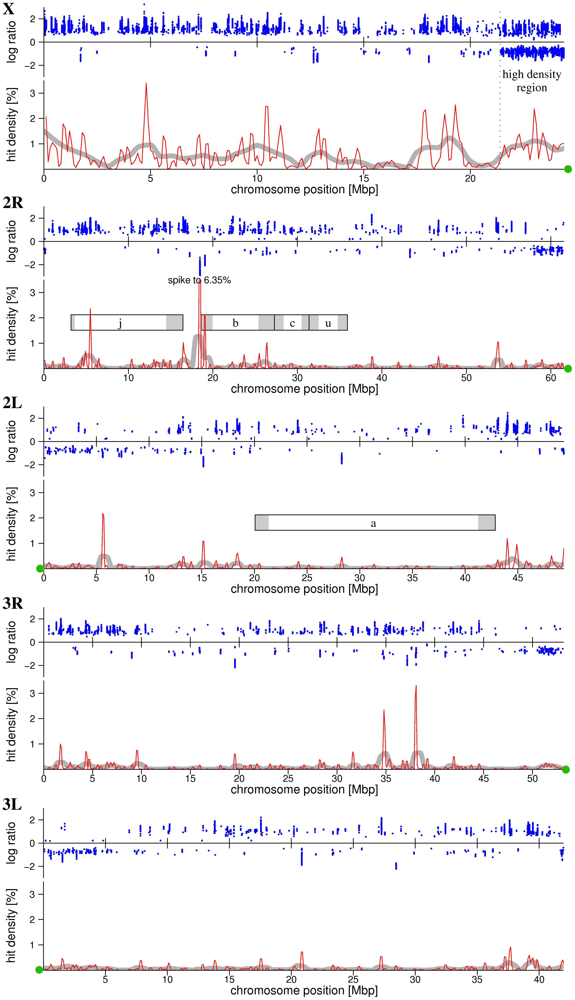

In [ ]:
ag3.pca?

In [ ]:
Ug_pca_df, evr = ag3.pca(
    region= '3L',
    n_snps= 100_000,
    sample_sets="AG1000G-UG"
)

Compute SNP allele counts:   0%|          | 0/1224 [00:00<?, ?it/s]

Load SNP genotypes:   0%|          | 0/1632 [00:00<?, ?it/s]

In [ ]:
Ug_pca_df

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,AC0007-C,1_A2,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-0.348853,1.526835,-0.943030,0.445535,-0.370399,0.506226,0.327990,0.256948,0.297498,1.246876
1,AC0008-C,1_A6,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,0.164477,1.100665,-0.017216,1.345930,-0.732449,1.040817,-0.636018,1.546844,0.484075,-0.092571
2,AC0009-Cx,1_A7,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-1.260080,-1.754013,-1.617960,0.285187,-0.044419,-1.344772,-0.281468,-0.827497,-1.782819,-0.869176
3,AC0010-C,1_A9,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-1.191364,-1.201746,0.601979,1.037150,0.490879,-1.251396,1.274685,-0.555336,-0.218661,-0.325209
4,AC0011-C,1_B5,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-2.356979,0.032833,0.019136,0.779696,1.080471,-1.412151,1.608442,-0.816989,-0.313206,0.298743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,AC0295-C,K92,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,32.440536,-39.413559,21.882307,-35.774483,16.350838,-29.522369,-4.744649,-12.703968,34.707150,13.010389
286,AC0296-C,K93,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,16.364042,-21.284760,63.508255,67.842957,-37.460720,-16.020500,0.522391,20.327496,-23.677225,8.781365
287,AC0297-C,K94,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,29.690655,-114.289001,124.814644,8.917171,-22.328283,14.369177,18.228346,-17.589869,-25.862499,-48.642643
288,AC0298-C,K95,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,-4.566115,54.420830,4.863276,-0.044859,-7.263776,24.966780,-0.672393,28.473495,-8.841607,-49.840862


In [ ]:
evr

array([0.04766026, 0.00574468, 0.00550776, 0.00521267, 0.00510677,
       0.0049093 , 0.00479862, 0.00466181, 0.004626  , 0.00460883,
       0.00458077, 0.00455114, 0.00450262, 0.00447397, 0.00445055,
       0.00441797, 0.00441113, 0.00438389, 0.004363  , 0.00435139],
      dtype=float32)

In [ ]:
ag3.plot_pca_variance(evr)

PC1 explains most of the variance

In [ ]:
ag3.plot_pca_coords(Ug_pca_df, color="aim_species")

PC1 describes the most variation in the Uganda dataset, with population structure driven by species. The strong degree of separation between An. gambiae and An. aarabiensis shows a high degree of reproductive isolation between the 2 species.
There is one sample found equidistant from the 2 taxons. From the AIM analysis, this individual didnot carry enough SNPs of either species and was classified as 'intermediate_gambcolu_arabiensis`. This PCA provides further evidence that this is a F1 hybrid of An. gamabiae and An. arabiensis.

## Step 3 - Geographic Structure

#### For An. arabiensis

In [ ]:
Ug_arab_pca_df, evr_arab = ag3.pca(
    region="3L",
    n_snps=100_000,
    sample_sets= 'AG1000G-UG',
    sample_query= "taxon == 'arabiensis'",
)

Compute SNP allele counts:   0%|          | 0/952 [00:00<?, ?it/s]

Load SNP genotypes:   0%|          | 0/816 [00:00<?, ?it/s]

In [ ]:
Ug_arab_pca_df

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,AC0007-C,1_A2,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,52.477615,-33.887875,-15.689081,12.390856,-3.651526,20.198551,-60.323639,8.328471,-27.078691,6.550605
1,AC0008-C,1_A6,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-14.225953,99.600647,45.013851,155.492004,28.463982,-7.088745,-88.711998,42.742847,27.614349,-57.627918
2,AC0009-Cx,1_A7,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-33.196793,185.906876,-32.497383,-103.283524,86.585342,-2.750164,-47.985462,9.406705,-49.936142,-80.948959
3,AC0010-C,1_A9,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,70.548729,28.729298,-33.611897,8.760976,-5.398899,61.754505,27.466848,-105.445900,-37.340065,41.517162
4,AC0011-C,1_B5,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-31.213015,-25.402693,-3.230816,-81.941223,-4.853692,-16.300610,88.142120,29.593895,111.340561,-28.186609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,AC0085-C,3_E2,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-15.221326,17.654287,-0.556991,28.380314,2.710964,-40.162991,69.833572,-30.442757,-23.355177,62.203392
78,AC0086-C,3_F1,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-12.183727,-59.566437,65.666245,75.609161,-2.620417,73.343842,42.333736,23.962303,-58.558502,-94.329796
79,AC0087-Cx,3_F2,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-8.023434,9.166565,5.171247,-55.100128,33.551891,7.529858,76.454361,-8.542483,-8.278744,36.724789
80,AC0088-C,3_G1,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-71.194138,-34.417465,58.552582,-3.172541,-41.802734,-38.266708,-57.049641,-21.502607,12.795568,-8.140317


In [ ]:
ag3.plot_pca_variance(evr_arab)

In [ ]:
ag3.plot_pca_coords?


In [ ]:
ag3.plot_pca_coords(
    Ug_arab_pca_df,
    color= 'location',
    symbol = 'admin2_name'
)

There is no geographic isolation between An. arabiensis from Tororo(Nagonera) and Kanungu (Kihihi). There was only 1 An. arabiensis sample from Kanungu site.

#### For An. gambiae

In [ ]:
Ug_gamb_pca_df, evr_gamb = ag3.pca(
    region="3L",
    n_snps=100_000,
    sample_sets= 'AG1000G-UG',
    sample_query= "taxon == 'gambiae'",
)

Compute SNP allele counts:   0%|          | 0/1632 [00:00<?, ?it/s]

Load SNP genotypes:   0%|          | 0/1360 [00:00<?, ?it/s]

In [ ]:
Ug_gamb_pca_df

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,AC0089-Cx,1_A1,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-2.756147,-25.071373,1.172815,0.087617,-29.398464,-7.992000,-18.021954,-10.043676,-6.019289,5.062277
1,AC0090-C,1_A4,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,16.869453,-13.503959,-13.361988,42.505642,0.137780,17.328884,-13.281349,-32.519066,-2.273365,6.200946
2,AC0091-Cx,1_A5,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-26.512924,-2.329469,-16.764416,-32.653793,19.520693,-20.974173,19.876657,16.519064,-5.858262,32.948036
3,AC0092-C,1_A8,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-24.974541,15.435518,-15.531436,-18.697153,-13.406199,-30.117764,-1.942946,-24.617668,14.742665,-14.028464
4,AC0093-C,1_A10,Martin Donnelly,Uganda,Nagongera,2012,10,0.770,34.026,F,...,-65.523613,-8.005296,-49.981159,-76.951538,45.074596,-20.174784,-3.479535,23.121119,-20.926022,-14.446106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,AC0295-C,K92,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,17.440943,-30.225952,-33.354485,-4.017671,18.999304,35.743786,11.818102,34.651840,-19.653240,-5.219552
203,AC0296-C,K93,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,-20.899752,-41.869850,4.737118,20.640165,-15.674609,-3.432289,1.456750,4.372901,-17.584080,1.643460
204,AC0297-C,K94,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,20.195642,-89.905388,-73.025658,-64.191643,-80.817345,-3.153012,14.155131,-16.486116,12.603286,-3.778724
205,AC0298-C,K95,Martin Donnelly,Uganda,Kihihi,2012,11,-0.751,29.701,F,...,2.646988,33.473015,4.568954,-28.922077,-51.163048,8.065945,-14.194970,-49.291233,6.683415,-22.914701


In [ ]:
ag3.plot_pca_variance(evr_gamb)

In [ ]:
ag3.plot_pca_coords(
    Ug_gamb_pca_df,
    color= 'location',
    symbol = 'admin2_name'
)

Generally, there is no distinct clustering of mosquitoes by loctaion, indicating a high level of relatedness between mosquitoes from the 2 sites. However, mosquitoes from Nagongera cluster closer to each other, indicating a higher level of relatedness among the mosquitoes from this site compared with those from Kihihi. Two An. gambiae mosquitoes (AC0223-C and AC0240-C) cluster away from all other mosquitoes from Kihihi.

# Step 4 - Selection of cohorts
This refers to grouping of mosquito samples into biologically relevant units, based on geographical sampling area (spatially), time (temporal) and taxons. Available cohorts in the `Malariagen_data` package include:
  - cohort_admin1_year = grouped by taxon, admin level 1 and year
  - cohort_admin1_quarter = grouped by taxon, admin level 1 and year quarter
  - cohort_admin1_month = grouped by taxon, admin level 1 and month
  - cohort_admin2_year = grouped by taxon, admin level 2 and year
  - cohort_admin2_quarter = grouped by taxon, admin level 2 and year quarter
  - cohort_admin2_month = grouped by taxon, admin level 2 and month

#### Mosquito samples by location and taxon

In [ ]:
ag3.count_samples(
    sample_query="country == 'Uganda'"
)

taxon                                               arabiensis  gambiae  \
country admin1_iso admin1_name    admin2_name year                        
Uganda  UG-E       Eastern Region Tororo      2012          81      112   
        UG-W       Western Region Kanungu     2012           1       95   

taxon                                               unassigned  
country admin1_iso admin1_name    admin2_name year              
Uganda  UG-E       Eastern Region Tororo      2012           1  
        UG-W       Western Region Kanungu     2012           0

In [ ]:
# Number of mosquitoes by site and species
Ug_taxon_pivot2 = (
    df_Uganda.pivot_table(
        index= ['country', 'admin1_iso', 'admin1_name', 'admin2_name', 'year', 'month'],
        columns="taxon",
        values="sample_id",
        aggfunc="count",
        fill_value=0))
Ug_taxon_pivot2

taxon                                                     arabiensis  gambiae  \
country admin1_iso admin1_name    admin2_name year month                        
Uganda  UG-E       Eastern Region Tororo      2012 10             81      112   
        UG-W       Western Region Kanungu     2012 10              1       49   
                                                   11              0       46   

taxon                                                     unassigned  
country admin1_iso admin1_name    admin2_name year month              
Uganda  UG-E       Eastern Region Tororo      2012 10              1  
        UG-W       Western Region Kanungu     2012 10              0  
                                                   11              0

In [ ]:
df_Uganda.head()

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,admin1_name,admin1_iso,admin2_name,taxon,cohort_admin1_year,cohort_admin1_month,cohort_admin1_quarter,cohort_admin2_year,cohort_admin2_month,cohort_admin2_quarter
0,AC0007-C,1_A2,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
1,AC0008-C,1_A6,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
2,AC0009-Cx,1_A7,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
3,AC0010-C,1_A9,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
4,AC0011-C,1_B5,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4


In [ ]:
df_Uganda.query("taxon == 'arabiensis' and location== 'Kihihi'")

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,admin1_name,admin1_iso,admin2_name,taxon,cohort_admin1_year,cohort_admin1_month,cohort_admin1_quarter,cohort_admin2_year,cohort_admin2_month,cohort_admin2_quarter
195,AC0205-C,K2,Martin Donnelly,Uganda,Kihihi,2012,10,-0.751,29.701,F,...,Western Region,UG-W,Kanungu,arabiensis,UG-W_arab_2012,UG-W_arab_2012_10,UG-W_arab_2012_Q4,UG-W_Kanungu_arab_2012,UG-W_Kanungu_arab_2012_10,UG-W_Kanungu_arab_2012_Q4


#### Grouping mosquitoes into relevant cohorts

In [ ]:
df_Uganda.groupby('cohort_admin1_year').size()

cohort_admin1_year
UG-E_arab_2012     81
UG-E_gamb_2012    112
UG-W_arab_2012      1
UG-W_gamb_2012     95
dtype: int64

In [ ]:
df_Uganda.groupby('cohort_admin1_month').size()

cohort_admin1_month
UG-E_arab_2012_10     81
UG-E_gamb_2012_10    112
UG-W_arab_2012_10      1
UG-W_gamb_2012_10     49
UG-W_gamb_2012_11     46
dtype: int64

In [ ]:
df_Uganda.groupby('cohort_admin1_quarter').size()

cohort_admin1_quarter
UG-E_arab_2012_Q4     81
UG-E_gamb_2012_Q4    112
UG-W_arab_2012_Q4      1
UG-W_gamb_2012_Q4     95
dtype: int64

In [ ]:
df_Uganda.groupby('cohort_admin2_year').size()

cohort_admin2_year
UG-E_Tororo_arab_2012      81
UG-E_Tororo_gamb_2012     112
UG-W_Kanungu_arab_2012      1
UG-W_Kanungu_gamb_2012     95
dtype: int64

In [ ]:
df_Uganda.groupby('cohort_admin2_month').size()

cohort_admin2_month
UG-E_Tororo_arab_2012_10      81
UG-E_Tororo_gamb_2012_10     112
UG-W_Kanungu_arab_2012_10      1
UG-W_Kanungu_gamb_2012_10     49
UG-W_Kanungu_gamb_2012_11     46
dtype: int64

From the above, grouping by `cohort_admin1_year` or `cohort_admin2_year` reult in the most relevant groups of mosquitoes. These 2 columns group mosquitoes by species and collection area, and contain the highest number of samples per cohort

In [ ]:
df_Uganda.groupby('cohort_admin2_year').size()

cohort_admin2_year
UG-E_Tororo_arab_2012      81
UG-E_Tororo_gamb_2012     112
UG-W_Kanungu_arab_2012      1
UG-W_Kanungu_gamb_2012     95
dtype: int64

In [ ]:
df_Uganda.groupby('cohort_admin2_month').size()

cohort_admin2_month
UG-E_Tororo_arab_2012_10      81
UG-E_Tororo_gamb_2012_10     112
UG-W_Kanungu_arab_2012_10      1
UG-W_Kanungu_gamb_2012_10     49
UG-W_Kanungu_gamb_2012_11     46
dtype: int64

# Step 5 - Genetic diversity analysis
This is done to determine the level of genetic diversity  among mosquito populations, and check for any  evidence of recent inbreeding in any mosquito cohorts.

Relevant analyses include:
  - Diversity summary statistics (nucleotide diversity `(theta_pi)`, Watterson estimator `(theta_w)`, Tajima's D `(tajima_d)`)
  - Runs of Homozygosity (ROH) and Heterozygosity


### Diversity Summary stats

a) Cohort `UG-E_Tororo_arab_2012`

In [ ]:
Tor_arab_stats = ag3.cohort_diversity_stats(
    cohort="UG-E_Tororo_arab_2012",
    cohort_size=30,
    region="3L:15,000,000-41,000,000",
    site_mask="gamb_colu_arab",
    site_class="CDS_DEG_4",
)
Tor_arab_stats

Locate CDS_DEG_4 sites:   0%|          | 0/448 [00:00<?, ?it/s]

Compute SNP allele counts:   0%|          | 0/913 [00:00<?, ?it/s]

cohort               UG-E_Tororo_arab_2012
theta_pi                          0.012561
theta_pi_estimate                 0.012561
theta_pi_bias                          0.0
theta_pi_std_err                  0.000222
theta_pi_ci_err                   0.000869
theta_pi_ci_low                   0.012126
theta_pi_ci_upp                   0.012995
theta_w                           0.017587
theta_w_estimate                  0.017585
theta_w_bias                      0.000001
theta_w_std_err                   0.000252
theta_w_ci_err                    0.000989
theta_w_ci_low                    0.017091
theta_w_ci_upp                     0.01808
tajima_d                         -1.026865
tajima_d_estimate                -1.026877
tajima_d_bias                     0.000012
tajima_d_std_err                  0.023756
tajima_d_ci_err                    0.09312
tajima_d_ci_low                  -1.073438
tajima_d_ci_upp                  -0.980317
taxon                           arabiensis
year       

b) Diversity stats for multiple cohorts simultaneously using the `cohort_admin2_year` grouping

In [ ]:
Ug_div_stats_admin2_year = ag3.diversity_stats(
    sample_query="country == 'Uganda'",
    cohorts="admin2_year",
    cohort_size=10,
    region="3L:15,000,000-41,000,000",
    site_mask="gamb_colu_arab",
    site_class="CDS_DEG_4",
)
Ug_div_stats_admin2_year

[INFO] cohort (UG-W_Kanungu_arab_2012) has insufficient samples (1) for requested cohort size (10), dropping


INFO:malariagen_data.anoph.base:cohort (UG-W_Kanungu_arab_2012) has insufficient samples (1) for requested cohort size (10), dropping


Compute SNP allele counts:   0%|          | 0/913 [00:00<?, ?it/s]

Compute SNP allele counts:   0%|          | 0/1245 [00:00<?, ?it/s]

Compute SNP allele counts:   0%|          | 0/913 [00:00<?, ?it/s]

,cohort,theta_pi,theta_pi_estimate,theta_pi_bias,theta_pi_std_err,theta_pi_ci_err,theta_pi_ci_low,theta_pi_ci_upp,theta_w,theta_w_estimate,...,tajima_d_ci_upp,taxon,year,month,country,admin1_iso,admin1_name,admin2_name,longitude,latitude
0,UG-E_Tororo_arab_2012,0.012560,0.012560,8.203444e-07,0.000224,0.000876,0.012121,0.012998,0.015198,0.015195,...,-0.679454,arabiensis,2012,10,Uganda,UG-E,Eastern Region,Tororo,34.026,0.770
1,UG-E_Tororo_gamb_2012,0.021693,0.021698,-4.572455e-06,0.000317,0.001244,0.021076,0.022320,0.031458,0.031460,...,-1.271359,gambiae,2012,10,Uganda,UG-E,Eastern Region,Tororo,34.026,0.770
2,UG-W_Kanungu_gamb_2012,0.021464,0.021469,-4.432877e-06,0.000310,0.001214,0.020862,0.022076,0.030680,0.030685,...,-1.225296,gambiae,2012,"[10, 11]",Uganda,UG-W,Western Region,Kanungu,29.701,-0.751


Bar plots visualizing the statistics

In [ ]:
px.bar(
    data_frame = Ug_div_stats_admin2_year,
    x= 'cohort',
    y="theta_pi_estimate",
    error_y="theta_pi_ci_err",
    color="taxon",
    height=450,
    width=500,
)

C) Diversity stats for multiple cohorts simultaneously using the `cohort_admin2_month` grouping

In [ ]:
Ug_div_stats_admin2_month = ag3.diversity_stats(
    sample_query="country == 'Uganda'",
    cohorts="admin2_month",
    cohort_size=10,
    region="3L:15,000,000-41,000,000",
    site_mask="gamb_colu_arab",
    site_class="CDS_DEG_4",
)
Ug_div_stats_admin2_month

[INFO] cohort (UG-W_Kanungu_arab_2012_10) has insufficient samples (1) for requested cohort size (10), dropping


INFO:malariagen_data.anoph.base:cohort (UG-W_Kanungu_arab_2012_10) has insufficient samples (1) for requested cohort size (10), dropping


Compute SNP allele counts:   0%|          | 0/913 [00:00<?, ?it/s]

Compute SNP allele counts:   0%|          | 0/1245 [00:00<?, ?it/s]

Compute SNP allele counts:   0%|          | 0/913 [00:00<?, ?it/s]

Compute SNP allele counts:   0%|          | 0/913 [00:00<?, ?it/s]

,cohort,theta_pi,theta_pi_estimate,theta_pi_bias,theta_pi_std_err,theta_pi_ci_err,theta_pi_ci_low,theta_pi_ci_upp,theta_w,theta_w_estimate,...,tajima_d_ci_upp,taxon,year,month,country,admin1_iso,admin1_name,admin2_name,longitude,latitude
0,UG-E_Tororo_arab_2012_10,0.012560,0.012560,8.203444e-07,0.000224,0.000876,0.012121,0.012998,0.015198,0.015195,...,-0.679454,arabiensis,2012,10,Uganda,UG-E,Eastern Region,Tororo,34.026,0.770
1,UG-E_Tororo_gamb_2012_10,0.021693,0.021698,-4.572455e-06,0.000317,0.001244,0.021076,0.022320,0.031458,0.031460,...,-1.271359,gambiae,2012,10,Uganda,UG-E,Eastern Region,Tororo,34.026,0.770
2,UG-W_Kanungu_gamb_2012_10,0.021448,0.021453,-5.295044e-06,0.000314,0.001233,0.020837,0.022070,0.030582,0.030584,...,-1.219808,gambiae,2012,10,Uganda,UG-W,Western Region,Kanungu,29.701,-0.751
3,UG-W_Kanungu_gamb_2012_11,0.021546,0.021550,-4.323979e-06,0.000309,0.001210,0.020945,0.022155,0.030902,0.030903,...,-1.236907,gambiae,2012,11,Uganda,UG-W,Western Region,Kanungu,29.701,-0.751


In [ ]:
px.bar(
    data_frame = Ug_div_stats_admin2_month,
    x= 'cohort',
    y="theta_pi_estimate",
    error_y="theta_pi_ci_err",
    color="taxon",
    height=450,
    width=500,
)

D) Function to Visualize nucleotide diversity, Watterson's theta, Tajima's D and comparison scatter.

In [ ]:
def plot_diversity_stats(
    df_stats,
    color=None,
    height=450,
    template="plotly_white"
):

    # set up common plotting parameters
    hover_name = "cohort"
    hover_data = ["taxon", "country", "admin1_iso", "admin1_name", "admin2_name", "year","month",]
    labels = {'theta_pi_estimate': r'$\widehat{\theta}_{\pi}$',
        'theta_w_estimate': r'$\widehat{\theta}_{w}$',
        'tajima_d_estimate': r'$D$',
        'cohort': "Cohort",
        'taxon': 'Taxon',
        'country': "Country",}
    category_orders = {"taxon": ["arabiensis", "gambiae", "gcx3", "coluzzii", "gcx1", "gcx2"],}
    width = 300 + 30 * len(df_stats)

    # nucleotide diversity bar plot
    fig = px.bar(
        data_frame=df_stats,
        x="cohort",
        y="theta_pi_estimate",
        error_y="theta_pi_ci_err",
        title="Nucleotide diversity",
        color=color,
        height=height,
        width=width,
        hover_name=hover_name,
        hover_data=hover_data,
        labels=labels,
        template=template,
        category_orders=category_orders,
    )
    fig.show()

    # watterson estimator bar plot
    fig = px.bar(
        data_frame=df_stats,
        x="cohort",
        y="theta_w_estimate",
        error_y="theta_w_ci_err",
        title="Watterson estimator",
        color=color,
        height=height,
        width=width,
        hover_name=hover_name,
        hover_data=hover_data,
        labels=labels,
        template=template,
        category_orders=category_orders,
    )
    fig.show()

    # tajima's d bar plot
    fig = px.bar(
        data_frame=df_stats,
        x="cohort",
        y="tajima_d_estimate",
        error_y="tajima_d_ci_err",
        title="Tajima's D",
        color=color,
        height=height,
        width=width,
        hover_name=hover_name,
        hover_data=hover_data,
        labels=labels,
        template=template,
        category_orders=category_orders,
    )
    fig.show()

    # scatter plot comparing diversity estimators
    fig = px.scatter(
        data_frame=df_stats,
        x="theta_pi_estimate",
        y="theta_w_estimate",
        error_x="theta_pi_ci_err",
        error_y="theta_w_ci_err",
        title="Diversity estimators",
        color=color,
        width=500,
        height=500,
        hover_name=hover_name,
        hover_data=hover_data,
        labels=labels,
        template=template,
        category_orders=category_orders,
    )
    fig.show()

In [ ]:
plot_diversity_stats(Ug_div_stats_admin2_year, color="taxon")

From the above plots:
  - An. gambiae has higher diversity than An. arabiensis
  - Both An. gambiae cohorts from Nagongera (Tororo) and Kihihi (Kanungu) have simialar genetic diversity, indicating shared demographic histories, and absence of geographical isolation/structuring.
  - All the 3 mosquito cohorts have a negative Tajima'D, indicating recent population expansions.

### Runs of Homozygosity (ROH) and Heterozygosity
These analyses are done to determine the level of inbreeding in a population. We will use the following samples:
  
1. AC0009-Cx (a wild An. arabiensis mosquito from Nagongera)
2. AC0205-C (the only An. arabiensis from Kihihi site)
3. AC0198-C (an intermediate mosquito of unassigned taxon from Nagongera)
4. AC0176-Cx (a wild An. gambiae from Nagongera)
5. AC0223-C (An. gambiae mosquito from Kanungu)

In [ ]:
ag3.plot_heterozygosity?

In [ ]:
ag3.site_mask_ids

('gamb_colu_arab', 'gamb_colu', 'arab')

In [ ]:
# Ugandan samples
df_Uganda.head()

,sample_id,partner_sample_id,contributor,country,location,year,month,latitude,longitude,sex_call,...,admin1_name,admin1_iso,admin2_name,taxon,cohort_admin1_year,cohort_admin1_month,cohort_admin1_quarter,cohort_admin2_year,cohort_admin2_month,cohort_admin2_quarter
0,AC0007-C,1_A2,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
1,AC0008-C,1_A6,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
2,AC0009-Cx,1_A7,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
3,AC0010-C,1_A9,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4
4,AC0011-C,1_B5,Martin Donnelly,Uganda,Nagongera,2012,10,0.77,34.026,F,...,Eastern Region,UG-E,Tororo,arabiensis,UG-E_arab_2012,UG-E_arab_2012_10,UG-E_arab_2012_Q4,UG-E_Tororo_arab_2012,UG-E_Tororo_arab_2012_10,UG-E_Tororo_arab_2012_Q4


1) AC0009-Cx (a wild An. arabiensis mosquito from Nagongera)

In [ ]:
ag3.plot_heterozygosity(
    sample="AC0009-Cx",
    region="3R",
    site_mask="arab",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [ ]:
ag3.plot_roh(
    sample="AC0009-Cx",
    region="3R",
    site_mask="arab",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



2) AC0205-C (the only An. arabiensis from Kihihi)

In [ ]:
ag3.plot_heterozygosity(
    sample="AC0205-C",
    region="3R",
    site_mask="arab",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [ ]:
ag3.plot_roh(
    sample="AC0205-C",
    region="3R",
    site_mask="arab",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



3) AC0198-C (unassigned taxon or gambiae-arabiensis intermediate)

In [ ]:
ag3.plot_heterozygosity(
    sample="AC0198-C",
    region="3R",
    site_mask="gamb_colu_arab",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [ ]:
ag3.plot_roh(
    sample="AC0198-C",
    region="3R",
    site_mask="gamb_colu_arab",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



4) AC0176-Cx (a wild An. gambiae from Nagongera)

In [ ]:
ag3.plot_heterozygosity(
    sample="AC0176-Cx",
    region="3R",
    site_mask="gamb_colu",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [ ]:
ag3.plot_roh(
    sample="AC0176-Cx",
    region="3R",
    site_mask="gamb_colu",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



5) AC0223-C (An. gambiae mosquito from Kanungu)

In [ ]:
ag3.plot_heterozygosity(
    sample="AC0223-C",
    region="3R",
    site_mask="gamb_colu",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1299: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



In [ ]:
ag3.plot_roh(
    sample="AC0223-C",
    region="3R",
    site_mask="gamb_colu",
    window_size=10_000,
);

Compute heterozygous genotypes:   0%|          | 0/350 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anopheles.py:1594: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



# Step 6 - Insecticide resistance variant frequencies.
This section includes analysis of SNPs and CNVs associated with insecticide resistance. This include SNPs in the `Vgsc gene` associated with pyrethroid resistance, SNPs in the `Gste genes` and CNVs in the `Cypaap` and `Gste` genes responsible for metabolic resistance.

## Accessing Copy Number Variation data
- Using the `.cnv_hmm()` function to access CNV HMM data from CNV calls
- Using the `.plot_cnv_hmm_coverage()` function to show plot CNV/HMM data for a sample or number of samples for specified gene regions.
- Using the `.plot_cnv_hmm_heatmap()` function to show/plot HMM/CNV data for a given sample_set for a specified gene region.

In [ ]:
# ag3.cnv_hmm?

In [ ]:
# ag3.plot_cnv_hmm_coverage?

In [ ]:
# ag3.plot_cnv_hmm_heatmap?

### a) CNV Dataset

In [ ]:
Ug_hmm = ag3.cnv_hmm(region="2R", sample_sets = 'AG1000G-UG').set_index(samples="sample_id")
Ug_hmm

<xarray.Dataset>
Dimensions:                   (variants: 205151, samples: 288)
Coordinates:
    variant_position          (variants) int32 dask.array<chunksize=(65536,), meta=np.ndarray>
    variant_end               (variants) int32 dask.array<chunksize=(65536,), meta=np.ndarray>
    variant_contig            (variants) uint8 dask.array<chunksize=(205151,), meta=np.ndarray>
  * samples                   (samples) object 'AC0007-C' ... 'AC0299-C'
Dimensions without coordinates: variants
Data variables:
    call_CN                   (variants, samples) int8 dask.array<chunksize=(65536, 64), meta=np.ndarray>
    call_RawCov               (variants, samples) int32 dask.array<chunksize=(65536, 64), meta=np.ndarray>
    call_NormCov              (variants, samples) float32 dask.array<chunksize=(65536, 64), meta=np.ndarray>
    sample_coverage_variance  (samples) float32 dask.array<chunksize=(288,), meta=np.ndarray>
    sample_is_high_variance   (samples) bool dask.array<chunksize=(288,), meta=np.ndarray>
Attributes:
    contigs:  ('2R', '2L', '3R', '3L', 'X')

### xarray.Dataset into pandas dataframe

In [ ]:
Ug_CNV_df =  Ug_hmm.to_dataframe()
Ug_CNV_df

call_CN  call_RawCov  call_NormCov  \
variants samples                                         
0        AC0007-C         2          147         2.297   
         AC0008-C         3          322         3.766   
         AC0009-Cx        3          219         3.395   
         AC0010-C         3          224         3.368   
         AC0011-C         2          191         3.008   
...                     ...          ...           ...   
205150   AC0295-C        -1           -1           NaN   
         AC0296-C        -1           -1           NaN   
         AC0297-C        -1           -1           NaN   
         AC0298-C        -1           -1           NaN   
         AC0299-C        -1           -1           NaN   

                    sample_coverage_variance  sample_is_high_variance  \
variants samples                                                        
0        AC0007-C                   0.076066                    False   
         AC0008-C                   0.074779                    False   
         AC0009-Cx                  0.086254                    False   
         AC0010-C                   0.072296                    False   
         AC0011-C                   0.074317                    False   
...                                      ...                      ...   
205150   AC0295-C                   0.088070                    False   
         AC0296-C                   0.081668                    False   
         AC0297-C                   0.082182                    False   
         AC0298-C                   0.099996                    False   
         AC0299-C                   0.092532                    False   

                    variant_position  variant_end  variant_contig  
variants samples                                                   
0        AC0007-C                  1          300               0  
         AC0008-C                  1          300               0  
         AC0009-Cx                 1          300               0  
         AC0010-C                  1          300               0  
         AC0011-C                  1          300               0  
...                              ...          ...             ...  
205150   AC0295-C           61545001     61545105               0  
         AC0296-C           61545001     61545105               0  
         AC0297-C           61545001     61545105               0  
         AC0298-C           61545001     61545105               0  
         AC0299-C           61545001     61545105               0  

[59083488 rows x 8 columns]

### 1) CNVs Cyp6aa/Cyp6p gene cluster for selected samples in the Ugandan sampleset

In [ ]:
sample_names = ['AC0007-C', 'AC0009-Cx', 'AC0011-C']

In [ ]:
# ag3.plot_cnv_hmm_coverage?

In [ ]:
for s in sample_names:
  ag3.plot_cnv_hmm_coverage(s, sample_set = 'AG1000G-UG', region='2R:28,460,000-28,580,000')

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:703: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:703: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:703: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:703: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:703: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:703: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



### Cyp6aa/Cyp6p gene copy numbers for Ugandan Samples

In [ ]:
# Access per-gene modal copy number data for all genes in chromosome arm 2R
gene_copy_number = (
    ag3.gene_cnv(region="2R", sample_sets="AG1000G-UG")
    .set_index(genes="gene_id", samples="sample_id")
)

# Define genes of interest
cyp6aap_genes = dict(AGAP002862='Cyp6aa1',
                     AGAP013128='Cyp6aa2',
                     AGAP002868='Cyp6p1',
                     AGAP002869='Cyp6p2',
                     AGAP002865='Cyp6p3',
                     AGAP002867='Cyp6p4',
                     AGAP002866='Cyp6p5')

# Select data for genes of interest, excluding samples with poor quality HMM data
cyp6aap_gene_cnv_ug = (
    gene_copy_number["CN_mode"]
    .sel(genes=list(cyp6aap_genes.keys()))
    .where(~gene_copy_number.sample_is_high_variance, drop=True)
    .transpose()
    .to_pandas()
    .rename(cyp6aap_genes, axis='columns')
)

cyp6aap_gene_cnv_ug

Load CNV HMM data:   0%|          | 0/48 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/3668 [00:00<?, ?it/s]

genes,Cyp6aa1,Cyp6aa2,Cyp6p1,Cyp6p2,Cyp6p3,Cyp6p4,Cyp6p5
samples,,,,,,,
AC0007-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0008-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0009-Cx,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0010-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0011-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...
AC0295-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0296-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0297-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [ ]:
Cypaa1_amplification_df = cyp6aap_gene_cnv_ug[cyp6aap_gene_cnv_ug['Cyp6aa1']>2.0]
Cypaa1_amplification_df

genes,Cyp6aa1,Cyp6aa2,Cyp6p1,Cyp6p2,Cyp6p3,Cyp6p4,Cyp6p5
samples,,,,,,,
AC0082-C,3.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0089-Cx,3.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0092-C,4.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0093-C,3.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0095-C,4.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...
AC0282-C,3.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0283-C,3.0,3.0,2.0,2.0,2.0,2.0,2.0
AC0288-C,3.0,3.0,3.0,3.0,3.0,3.0,3.0


### Function to show number of gene copies in each gene in the selected geneomic region

In [ ]:
def plot_gene_cnv_heatmap(data):

    # create a figure
    figsize = data.shape[1], data.shape[0]*0.7
    fig, ax = plt.subplots(figsize=figsize)

    # plot a heatmap
    sns.heatmap(
        data,
        annot=True,
        cbar=False,
        cmap='bwr',
        center=2,
        linewidths=0.05,
        ax=ax
    )

    # tidy plot
    ax.tick_params(
        axis='both',
        which='major',
        labelsize=10,
        labelbottom=False,
        bottom=False,
        top=False,
        labeltop=True,
        left=False
    )
    ax.xaxis.set_label_position('top')

#### Cyp6aap gene heatmaps

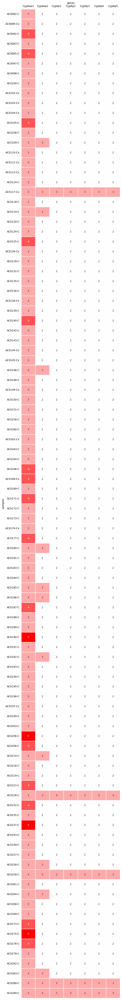

In [ ]:
plot_gene_cnv_heatmap(Cypaa1_amplification_df.iloc[:100])

In [ ]:
# Ugandan sample_set
ag3.plot_cnv_hmm_heatmap(
    region = '2R:28,460,000-28,580,000',
    sample_sets = 'AG1000G-UG',
    row_height = 5
);

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:906: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:906: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



From the above heatmaps, there is evidence copy number increase in the `Cyp6aa1 ` gene of some of the Ugandan mosquito samples

##

In [ ]:
# Access per-gene modal copy number data for all genes in chromosome arm 2R
gene_copy_number = (
    ag3.gene_cnv(region="3R", sample_sets="AG1000G-UG")
    .set_index(genes="gene_id", samples="sample_id")
)

# Define genes of interest
gste_genes = dict(AGAP009195='Gste1',
                  AGAP009194='Gste2',
                  AGAP009197='Gste3',
                  AGAP009193='Gste4',
                  AGAP009192='Gste5',
                  AGAP009191='Gste6',
                  AGAP009196='Gste7',
                  AGAP009190='Gste8'
                  )

# Select data for genes of interest, excluding samples with poor quality HMM data
Gste_gene_cnv_ug = (
    gene_copy_number["CN_mode"]
    .sel(genes=list(gste_genes.keys()))
    .where(~gene_copy_number.sample_is_high_variance, drop=True)
    .transpose()
    .to_pandas()
    .rename(gste_genes, axis='columns')
)

Gste_gene_cnv_ug

Load CNV HMM data:   0%|          | 0/36 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/2686 [00:00<?, ?it/s]

genes,Gste1,Gste2,Gste3,Gste4,Gste5,Gste6,Gste7,Gste8
samples,,,,,,,,
AC0007-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0008-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0009-Cx,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0010-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0011-C,4.0,4.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...
AC0295-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0296-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
AC0297-C,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [ ]:
Gste_gene_cnv_ug[Gste_gene_cnv_ug !=2].dropna()

genes,Gste1,Gste2,Gste3,Gste4,Gste5,Gste6,Gste7,Gste8
samples,,,,,,,,


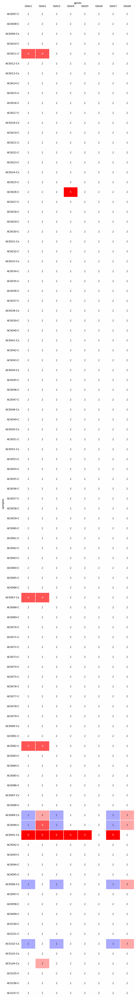

In [ ]:
plot_gene_cnv_heatmap(Gste_gene_cnv_ug.iloc[:100])

In [ ]:
ag3.plot_cnv_hmm_heatmap(
    region = '3R:28,585,000-28,610,000',
    sample_sets = 'AG1000G-UG',
    row_height = 5
);
# '3R:28,570,000-28,630,000'

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:906: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

/usr/local/lib/python3.10/dist-packages/malariagen_data/anoph/cnv_data.py:906: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



From the above heatmaps, there is evidence of a copy number increase the `Gste1`, `Gste2`, `Gste4`, `Gste5` and `Gste8` genes. There is also evidence of copy number decrease in the `Gste3` and `Gste7` genes.

### Cyp6aap gene CNV frequecies in the Uganda dataset

CNV frequency dataframe

In [ ]:
Ug_cyp6aap_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region="2R:28,480,000-28,510,000",
    cohorts= "admin2_year",
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
Ug_cyp6aap_cnv_freqs_df

Load CNV HMM data:   0%|          | 0/48 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/11 [00:00<?, ?it/s]

gene_strand  \
gene_id    gene_name cnv_type               
AGAP002859 NaN       amp                +   
                     del                +   
AGAP002862 CYP6AA1   amp                -   
                     del                -   
AGAP013128 CYP6AA2   amp                -   
                     del                -   
AGAP002863 COEAE6O   amp                -   
                     del                -   
AGAP002864 CYP6P15P  amp                -   
                     del                -   
AGAP002865 CYP6P3    amp                -   
                     del                -   
AGAP002866 CYP6P5    amp                -   
                     del                -   
AGAP002867 CYP6P4    amp                -   
                     del                -   
AGAP002868 CYP6P1    amp                -   
                     del                -   
AGAP002869 CYP6P2    amp                -   
                     del                -   
AGAP002870 CYP6AD1   amp                -   
                     del                -   

                                                                gene_description  \
gene_id    gene_name cnv_type                                                      
AGAP002859 NaN       amp       solute carrier family 8 (sodium/calcium exchan...   
                     del       solute carrier family 8 (sodium/calcium exchan...   
AGAP002862 CYP6AA1   amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP013128 CYP6AA2   amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002863 COEAE6O   amp       carboxylesterase alpha esterase [Source:VB Com...   
                     del       carboxylesterase alpha esterase [Source:VB Com...   
AGAP002864 CYP6P15P  amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002865 CYP6P3    amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002866 CYP6P5    amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002867 CYP6P4    amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002868 CYP6P1    amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002869 CYP6P2    amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   
AGAP002870 CYP6AD1   amp        cytochrome P450 [Source:VB Community Annotation]   
                     del        cytochrome P450 [Source:VB Community Annotation]   

                              contig     start       end  \
gene_id    gene_name cnv_type                              
AGAP002859 NaN       amp          2R  28397312  28516028   
                     del          2R  28397312  28516028   
AGAP002862 CYP6AA1   amp          2R  28480576  28482637   
                     del          2R  28480576  28482637   
AGAP013128 CYP6AA2   amp          2R  28483301  28484921   
                     del          2R  28483301  28484921   
AGAP002863 COEAE6O   amp          2R  28485262  28487080   
                     del          2R  28485262  28487080   
AGAP002864 CYP6P15P  amp          2R  28487640  28489092   
                     del          2R  28487640  28489092   
AGAP002865 CYP6P3    amp          2R  28491415  28493141   
                     del          2R  28491415  28493141   
AGAP002866 CYP6P5    amp          2R  28494017  28495645   
                     del        

Selecting CNV frequency columns

In [ ]:
frequency_columns = [
    col for col in Ug_cyp6aap_cnv_freqs_df.columns
    if col.startswith("frq_")
]
frequency_columns

['frq_UG-E_Tororo_arab_2012',
 'frq_UG-E_Tororo_gamb_2012',
 'frq_UG-W_Kanungu_gamb_2012']

CNV dataframe with frequency columns only

In [ ]:
Ug_cyp6aap_cnv_freqs_df[frequency_columns + ["max_af", "windows"]]

frq_UG-E_Tororo_arab_2012  \
gene_id    gene_name cnv_type                              
AGAP002859 NaN       amp                        0.000000   
                     del                        0.000000   
AGAP002862 CYP6AA1   amp                        0.012346   
                     del                        0.000000   
AGAP013128 CYP6AA2   amp                        0.000000   
                     del                        0.000000   
AGAP002863 COEAE6O   amp                        0.000000   
                     del                        0.000000   
AGAP002864 CYP6P15P  amp                        0.000000   
                     del                        0.000000   
AGAP002865 CYP6P3    amp                        0.000000   
                     del                        0.000000   
AGAP002866 CYP6P5    amp                        0.000000   
                     del                        0.000000   
AGAP002867 CYP6P4    amp                        0.000000   
                     del                        0.000000   
AGAP002868 CYP6P1    amp                        0.000000   
                     del                        0.000000   
AGAP002869 CYP6P2    amp                        0.000000   
                     del                        0.000000   
AGAP002870 CYP6AD1   amp                        0.000000   
                     del                        0.000000   

                               frq_UG-E_Tororo_gamb_2012  \
gene_id    gene_name cnv_type                              
AGAP002859 NaN       amp                        0.000000   
                     del                        0.000000   
AGAP002862 CYP6AA1   amp                        0.642857   
                     del                        0.000000   
AGAP013128 CYP6AA2   amp                        0.071429   
                     del                        0.000000   
AGAP002863 COEAE6O   amp                        0.017857   
                     del                        0.000000   
AGAP002864 CYP6P15P  amp                        0.017857   
                     del                        0.000000   
AGAP002865 CYP6P3    amp                        0.008929   
                     del                        0.000000   
AGAP002866 CYP6P5    amp                        0.008929   
                     del                        0.000000   
AGAP002867 CYP6P4    amp                        0.008929   
                     del                        0.000000   
AGAP002868 CYP6P1    amp                        0.008929   
                     del                        0.000000   
AGAP002869 CYP6P2    amp                        0.008929   
                     del                        0.000000   
AGAP002870 CYP6AD1   amp                        0.008929   
                     del                        0.000000   

                               frq_UG-W_Kanungu_gamb_2012    max_af  windows  
gene_id    gene_name cnv_type                                                 
AGAP002859 NaN       amp                         0.000000  0.000000      397  
                     del                         0.000000  0.000000      397  
AGAP002862 CYP6AA1   amp                         0.297872  0.642857        8  
                     del                         0.000000  0.000000        8  
AGAP013128 CYP6AA2   amp                         0.085106  0.085106        6  
                     del                         0.000000  0.000000        6  
AGAP002863 COEAE6O   amp                         0.042553  0.042553        7  
                     del                         0.000000  0.000000        7  
AGAP002864 CYP6P15P  amp                         0.042553  0.042553        6  
                     del                         0.000000  0.000000        6  
AGAP002865 CYP6P3    amp                         0.042553  0.042553        7  
                     del                         0.000000  0.000000        7  
AGAP002866 CYP6P5    amp                   

Cyp6aap CNV frequency heatmap for CNVs with maf > 5%

In [ ]:
ag3.plot_frequencies_heatmap(
    Ug_cyp6aap_cnv_freqs_df.query("max_af > 0.05"),
    title="Gene CNV frequencies, Uganda, Cyp6aa/p locus"
)

### Gste gene CNV frequencies in the Ugandan dataset

CNV frequency dataframe

In [ ]:
Ug_gste_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region="3R:28,590,000-28,610,000",
    cohorts= "admin2_year",
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
Ug_gste_cnv_freqs_df

Load CNV HMM data:   0%|          | 0/36 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/10 [00:00<?, ?it/s]

gene_strand  \
gene_id    gene_name cnv_type               
AGAP009189 NaN       amp                +   
                     del                +   
AGAP009190 GSTE8     amp                -   
                     del                -   
AGAP009191 GSTE6     amp                +   
                     del                +   
AGAP009192 GSTE5     amp                -   
                     del                -   
AGAP009193 GSTE4     amp                -   
                     del                -   
AGAP009194 GSTE2     amp                -   
                     del                -   
AGAP009195 GSTE1     amp                -   
                     del                -   
AGAP009196 GSTE7     amp                +   
                     del                +   
AGAP009197 GSTE3     amp                -   
                     del                -   
AGAP009198 NaN       amp                +   
                     del                +   

                                                                gene_description  \
gene_id    gene_name cnv_type                                                      
AGAP009189 NaN       amp                                                     NaN   
                     del                                                     NaN   
AGAP009190 GSTE8     amp       Glutathione S-transferase epsilon class 8 [Sou...   
                     del       Glutathione S-transferase epsilon class 8 [Sou...   
AGAP009191 GSTE6     amp       glutathione S-transferase epsilon class 6 [Sou...   
                     del       glutathione S-transferase epsilon class 6 [Sou...   
AGAP009192 GSTE5     amp       glutathione S-transferase epsilon class 5 [Sou...   
                     del       glutathione S-transferase epsilon class 5 [Sou...   
AGAP009193 GSTE4     amp       glutathione S-transferase epsilon class 4 [Sou...   
                     del       glutathione S-transferase epsilon class 4 [Sou...   
AGAP009194 GSTE2     amp       glutathione S-transferase epsilon class 2 [Sou...   
                     del       glutathione S-transferase epsilon class 2 [Sou...   
AGAP009195 GSTE1     amp       glutathione S-transferase epsilon class 1 [Sou...   
                     del       glutathione S-transferase epsilon class 1 [Sou...   
AGAP009196 GSTE7     amp       glutathione S-transferase epsilon class 7 [Sou...   
                     del       glutathione S-transferase epsilon class 7 [Sou...   
AGAP009197 GSTE3     amp       glutathione S-transferase epsilon class 3 [Sou...   
                     del       glutathione S-transferase epsilon class 3 [Sou...   
AGAP009198 NaN       amp                                                     NaN   
                     del                                                     NaN   

                              contig     start       end  \
gene_id    gene_name cnv_type                              
AGAP009189 NaN       amp          3R  28576092  28590073   
                     del          3R  28576092  28590073   
AGAP009190 GSTE8     amp          3R  28590243  28592545   
                     del          3R  28590243  28592545   
AGAP009191 GSTE6     amp          3R  28593714  28594762   
                     del          3R  28593714  28594762   
AGAP009192 GSTE5     amp          3R  28594993  28595802   
                     del          3R  28594993  28595802   
AGAP009193 GSTE4     amp          3R  28595948  28596868   
                     del          3R  28595948  28596868   
AGAP009194 GSTE2     amp          3R  28597652  28598640   
                     del          3R  28597652  28598640   
AGAP009195 GSTE1     amp          3R  28598871  28599816   
                     del          3R  28598871  28599816   
AGAP009196 GSTE7     amp          3R  28600347  28601354   
                     del          3R  28600347  28601354   
AGAP009197 GSTE3     amp          3R  28601368  28602280   
                     del          3R  28601368  28

Gste CNV frequency heatmap for CNVs with maf > 5%

In [ ]:
ag3.plot_frequencies_heatmap(
    Ug_gste_cnv_freqs_df.query("max_af > 0.05"),
    title="Gene CNV frequencies, Uganda, Gste locus"
)

- There was amplification

Gste2 CNVs

In [ ]:
Ug_gste2_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region="3R:28,597,652-28,598,640",
    cohorts= "admin2_year",
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
Ug_gste2_cnv_freqs_df

Load CNV HMM data:   0%|          | 0/36 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/1 [00:00<?, ?it/s]

gene_strand  \
gene_id    gene_name cnv_type               
AGAP009194 GSTE2     amp                -   
                     del                -   

                                                                gene_description  \
gene_id    gene_name cnv_type                                                      
AGAP009194 GSTE2     amp       glutathione S-transferase epsilon class 2 [Sou...   
                     del       glutathione S-transferase epsilon class 2 [Sou...   

                              contig     start       end  \
gene_id    gene_name cnv_type                              
AGAP009194 GSTE2     amp          3R  28597652  28598640   
                     del          3R  28597652  28598640   

                               frq_UG-E_Tororo_arab_2012  \
gene_id    gene_name cnv_type                              
AGAP009194 GSTE2     amp                        0.037037   
                     del                        0.000000   

                               frq_UG-E_Tororo_gamb_2012  \
gene_id    gene_name cnv_type                              
AGAP009194 GSTE2     amp                        0.169643   
                     del                        0.000000   

                               frq_UG-W_Kanungu_gamb_2012    max_af  windows  \
gene_id    gene_name cnv_type                                                  
AGAP009194 GSTE2     amp                          0.06383  0.169643        4   
                     del                          0.00000  0.000000        4   

                                                label  
gene_id    gene_name cnv_type                          
AGAP009194 GSTE2     amp       AGAP009194 (GSTE2) amp  
                     del       AGAP009194 (GSTE2) del

In [ ]:
ag3.plot_frequencies_heatmap(
    Ug_gste2_cnv_freqs_df.query("max_af > 0.05"),
    title="Gene CNV frequencies, Uganda, Gste2 locus"
)

- Increased frequency of Gste2 amplification An. gambiae cohort from Tororo.

### Ace1 gene CNV frequencies in the Ugandan dataset
The `Ace1` gene amplification results in increased production of Acetylcholinesterase and enables termination of neurotransmission in the presence of insecticides. This amplification has been associated with organosphospate and carbamate resistance

Ace1 CNV dataframe

In [ ]:
Ug_ace1_cnv_freqs_df = ag3.gene_cnv_frequencies(
    region="2R:3,483,099-3,497,400",
    cohorts= "admin2_year",
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
Ug_ace1_cnv_freqs_df

Load CNV HMM data:   0%|          | 0/48 [00:00<?, ?it/s]

Compute modal gene copy number:   0%|          | 0/1 [00:00<?, ?it/s]

gene_strand  \
gene_id    gene_name cnv_type               
AGAP001356 ACE1      amp                +   
                     del                +   

                                                                gene_description  \
gene_id    gene_name cnv_type                                                      
AGAP001356 ACE1      amp       Acetylcholinesterase [Source:UniProtKB/Swiss-P...   
                     del       Acetylcholinesterase [Source:UniProtKB/Swiss-P...   

                              contig    start      end  \
gene_id    gene_name cnv_type                            
AGAP001356 ACE1      amp          2R  3483099  3497400   
                     del          2R  3483099  3497400   

                               frq_UG-E_Tororo_arab_2012  \
gene_id    gene_name cnv_type                              
AGAP001356 ACE1      amp                             0.0   
                     del                             0.0   

                               frq_UG-E_Tororo_gamb_2012  \
gene_id    gene_name cnv_type                              
AGAP001356 ACE1      amp                             0.0   
                     del                             0.0   

                               frq_UG-W_Kanungu_gamb_2012  max_af  windows  \
gene_id    gene_name cnv_type                                                
AGAP001356 ACE1      amp                              0.0     0.0       48   
                     del                              0.0     0.0       48   

                                               label  
gene_id    gene_name cnv_type                         
AGAP001356 ACE1      amp       AGAP001356 (ACE1) amp  
                     del       AGAP001356 (ACE1) del

Ace1 CNV frequency heatmap

In [ ]:
ag3.plot_frequencies_heatmap(
    Ug_ace1_cnv_freqs_df.query("max_af > 0.05"),
    title="Gene CNV frequencies, Uganda, Ace1 gene"
)

- There was no amplification of the Ace1 gene in both mosquito taxa present in Uganda by 2012.

## SNP Data for the Ugandan dataset

### Vgsc gene SNP allele frequencies

In [ ]:
vgsc_snp_allele_freqs_df = ag3.snp_allele_frequencies(
    transcript = "AGAP004707-RD",
    cohorts='admin2_year',
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
vgsc_snp_allele_freqs_df

Load SNP genotypes:   0%|          | 0/24 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/4 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/209001 [00:00<?, ?it/s]

pass_gamb_colu_arab  \
contig position ref_allele alt_allele aa_change                        
2L     2358158  A          C          M1L                       True   
                           T          M1L                       True   
                           G          M1V                       True   
       2358159  T          A          M1K                       True   
                           C          M1T                       True   
...                                                              ...   
       2431616  G          C          *2119S                    True   
                           T          *2119L                    True   
       2431617  A          C          *2119C                    True   
                           T          *2119C                    True   
                           G          *2119W                    True   

                                                 pass_gamb_colu  pass_arab  \
contig position ref_allele alt_allele aa_change                              
2L     2358158  A          C          M1L                  True       True   
                           T          M1L                  True       True   
                           G          M1V                  True       True   
       2358159  T          A          M1K                  True       True   
                           C          M1T                  True       True   
...                                                         ...        ...   
       2431616  G          C          *2119S               True       True   
                           T          *2119L               True       True   
       2431617  A          C          *2119C               True       True   
                           T          *2119C               True       True   
                           G          *2119W               True       True   

                                                 frq_UG-E_Tororo_arab_2012  \
contig position ref_allele alt_allele aa_change                              
2L     2358158  A          C          M1L                              0.0   
                           T          M1L                              0.0   
                           G          M1V                              0.0   
       2358159  T          A          M1K                              0.0   
                           C          M1T                              0.0   
...                                                                    ...   
       2431616  G          C          *2119S                           0.0   
                           T          *2119L                           0.0   
       2431617  A          C          *2119C                           0.0   
                           T          *2119C                           0.0   
                           G          *2119W                           0.0   

                                                 frq_UG-E_Tororo_gamb_2012  \
contig position ref_allele alt_allele aa_change                              
2L     2358158  A          C          M1L                              0.0   
                           T          M1L                              0.0   
                           G          M1V                              0.0   
       2358159  T          A          M1K                              0.0   
                           C          M1T                              0.0   
...                                                                    ...   
       2431616  G          C          *2119S                           0.0   
                           T          *2119L                           0.0   
       2431617  A          C          *2119C                           0.0   
                           T          *2119C                           0.0   
                           G          *2119W                           0.0   

                                                 frq_UG-W_Kanungu_g

Vgsc SNP allele frequency heatmap for SNPs with non-synonymous coding effect and max allele frequency (max_af) > 5%

In [ ]:
ag3.plot_frequencies_heatmap(vgsc_snp_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >0.01"))

- The vgsc SNP `L995S` associated with pyrethroid target site resistance was present in all An. gambiae cohorts, but absent in the An. arabiensis cohort in 2012.

### Ace1 gene SNP allele frequencies

Ace1 SNP dataframe

In [ ]:
ag3.snp_allele_frequencies?

In [ ]:
ace1_snp_allele_freqs_df = ag3.snp_allele_frequencies(
    transcript = "AGAP001356-RA",
    cohorts='admin2_year',
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
ace1_snp_allele_freqs_df

Load SNP genotypes:   0%|          | 0/12 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/4 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/42906 [00:00<?, ?it/s]

pass_gamb_colu_arab  \
contig position ref_allele alt_allele aa_change                        
2R     3483099  C          A          NaN                       True   
                           T          NaN                       True   
                           G          NaN                       True   
       3483100  C          A          NaN                      False   
                           T          NaN                      False   
...                                                              ...   
       3497399  C          T          NaN                       True   
                           G          NaN                       True   
       3497400  G          A          NaN                       True   
                           C          NaN                       True   
                           T          NaN                       True   

                                                 pass_gamb_colu  pass_arab  \
contig position ref_allele alt_allele aa_change                              
2R     3483099  C          A          NaN                  True       True   
                           T          NaN                  True       True   
                           G          NaN                  True       True   
       3483100  C          A          NaN                  True      False   
                           T          NaN                  True      False   
...                                                         ...        ...   
       3497399  C          T          NaN                  True       True   
                           G          NaN                  True       True   
       3497400  G          A          NaN                  True       True   
                           C          NaN                  True       True   
                           T          NaN                  True       True   

                                                 frq_UG-E_Tororo_arab_2012  \
contig position ref_allele alt_allele aa_change                              
2R     3483099  C          A          NaN                         0.000000   
                           T          NaN                         0.012346   
                           G          NaN                         0.000000   
       3483100  C          A          NaN                         0.000000   
                           T          NaN                         0.000000   
...                                                                    ...   
       3497399  C          T          NaN                         0.037037   
                           G          NaN                         0.000000   
       3497400  G          A          NaN                         0.000000   
                           C          NaN                         0.000000   
                           T          NaN                         0.000000   

                                                 frq_UG-E_Tororo_gamb_2012  \
contig position ref_allele alt_allele aa_change                              
2R     3483099  C          A          NaN                         0.000000   
                           T          NaN                         0.000000   
                           G          NaN                         0.000000   
       3483100  C          A          NaN                         0.000000   
                           T          NaN                         0.000000   
...                                                                    ...   
       3497399  C          T          NaN                         0.004464   
                           G          NaN                         0.000000   
       3497400  G          A          NaN                         0.000000   
                           C          NaN                         0.000000   
                           T          NaN                         0.000000   

                                                 frq_UG-W_Kanungu_g

Ace1 SNP frequency heatmap for non-synonymous SNPs with max af >5%

In [ ]:
ag3.plot_frequencies_heatmap(ace1_snp_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >0.05"))

- High frequency of the `F35S` and `A65S` SNPs across all cohorts
- Higher frequency of `S338R` in An. gambie cohorts
- Higher frequency of `E477D` in An. arabiensis cohort

### Gste2 gene SNP allele frequencies

Gste2 gene SNP dataframe

In [ ]:
gste2_snp_allele_freqs_df = ag3.snp_allele_frequencies(
    transcript = "AGAP009194-RA",
    cohorts='admin2_year',
    sample_sets='AG1000G-UG',
    drop_invariant=False,
)
gste2_snp_allele_freqs_df

Load SNP genotypes:   0%|          | 0/12 [00:00<?, ?it/s]

Compute allele frequencies:   0%|          | 0/4 [00:00<?, ?it/s]

Compute SNP effects:   0%|          | 0/2967 [00:00<?, ?it/s]

pass_gamb_colu_arab  \
contig position ref_allele alt_allele aa_change                        
3R     28597652 G          A          NaN                       True   
                           C          NaN                       True   
                           T          NaN                       True   
       28597653 A          C          NaN                       True   
                           T          NaN                       True   
...                                                              ...   
       28598639 C          T          NaN                       True   
                           G          NaN                       True   
       28598640 G          A          NaN                      False   
                           C          NaN                      False   
                           T          NaN                      False   

                                                 pass_gamb_colu  pass_arab  \
contig position ref_allele alt_allele aa_change                              
3R     28597652 G          A          NaN                  True       True   
                           C          NaN                  True       True   
                           T          NaN                  True       True   
       28597653 A          C          NaN                  True       True   
                           T          NaN                  True       True   
...                                                         ...        ...   
       28598639 C          T          NaN                  True       True   
                           G          NaN                  True       True   
       28598640 G          A          NaN                 False      False   
                           C          NaN                 False      False   
                           T          NaN                 False      False   

                                                 frq_UG-E_Tororo_arab_2012  \
contig position ref_allele alt_allele aa_change                              
3R     28597652 G          A          NaN                         0.000000   
                           C          NaN                         0.000000   
                           T          NaN                         0.000000   
       28597653 A          C          NaN                         0.000000   
                           T          NaN                         0.000000   
...                                                                    ...   
       28598639 C          T          NaN                         0.000000   
                           G          NaN                         0.000000   
       28598640 G          A          NaN                         0.000000   
                           C          NaN                         0.604938   
                           T          NaN                         0.000000   

                                                 frq_UG-E_Tororo_gamb_2012  \
contig position ref_allele alt_allele aa_change                              
3R     28597652 G          A          NaN                          0.00000   
                           C          NaN                          0.00000   
                           T          NaN                          0.00000   
       28597653 A          C          NaN                          0.00000   
                           T          NaN                          0.00000   
...                                                                    ...   
       28598639 C          T          NaN                          0.00000   
                           G          NaN                          0.00000   
       28598640 G          A          NaN                          0.00000   
                           C          NaN                          0.03125   
                           T          NaN                          0.00000   

                                                 frq_UG-W_Kanungu_g

Gste2 SNP frequency heatmap for non-synonymous SNPs with max af >5%

In [ ]:
ag3.plot_frequencies_heatmap(gste2_snp_allele_freqs_df.query("effect == 'NON_SYNONYMOUS_CODING' and max_af >0.05"))

- SNP `N3K` occurred at a high frequency across all cohorts, but highest in the Tororo cohorts.
- SNPs `T21A`, `V91I` and `S98A` occurred in the An. arabiensis cohort only
- SNP `K92R` occurred in the An. gambiae cohorts only.
- SNPs `G26S` and `T154S` occurred at a higher frequency in the An. arabiensis cohorts than in the An. gambiae cohorts.

## Step 7 - Genome-wide selection scans (GWSS)

This refers to looking/scanning the genome to detect signals of positive selection. This analysis is important for detection of novel loci under selection in mosquito populations.

It involves:

- identifying regions under strong recent positive selection
- detecting any selection signals at known insecticide resistance genes
- assessing if any selection signals suggest new candidate insecticide resistance genes
- comparing outcomes of selection scans compare between cohorts.

Relevant analyses are:
- H12 statistic (measuring haplotype homozygosity or similarity of haplotypes carried by mosquitos)

### A) Select cohorts

In [ ]:
# Ugandan data
df_Uganda = ag3.sample_metadata(sample_query = "country == 'Uganda'")
# Ugandan Cohorts
df_Uganda.groupby('cohort_admin2_year').size()


cohort_admin2_year
UG-E_Tororo_arab_2012      81
UG-E_Tororo_gamb_2012     112
UG-W_Kanungu_arab_2012      1
UG-W_Kanungu_gamb_2012     95
dtype: int64

### B) Calibrate window size
Choose window size where 95% of the H12 values are below or at 0.1

In [ ]:
ag3.plot_h12_calibration(
    contig="3L",
    analysis="gamb_colu_arab",
    sample_sets="3.0",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
)

Load haplotypes:   0%|          | 0/160 [00:00<?, ?it/s]

Compute H12:   0%|          | 0/8 [00:00<?, ?it/s]

- A window size of 1000 SNPs is adequate to detect selection sweep signals

In [ ]:
# mount google drive inorder to save H12 results
try:
    from google.colab import drive
    drive.mount("drive")
except ImportError:
    pass

# create results directory
results_dir = "drive/MyDrive/malariagen_data_cache"

In [ ]:
ag3.phasing_analysis_ids

### C) Run GWSS H12 analysis

In [ ]:
ag3.plot_h12_gwss(
    contig="2R",
    analysis="gamb_colu_arab",
    window_size=1000,
    sample_sets="AG1000G-UG",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'"
)

### H12 analysis for cohort 'UG-E_Tororo_arab_2012'

In [ ]:
for contig in ag3.contigs:
  ag3.plot_h12_gwss(
      contig=contig,
      analysis="arab",
      sample_sets="3.0",
      sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
      window_size=1000
  )


#### Peak at 28.5Mb of contig 2R

In [ ]:
Cyp6ap_genes_df = (
    ag3.genome_features(region="2R:28,450,000-28,535,000")
    .query('type == "gene"')
    [["contig", "start", "end", "ID", "Name", "description"]]
    .set_index("ID")
)
Cyp6ap_genes_df

- This peak corresponds to the region where the cytochrome p450 (Cyp6aap) gene cluster is located. Amplification in the Cyp6aa1 and Cyp6aa2 genes has been associated with metabolic insecticide resistance.

#### Peak at 11.6 Mbp of contig 2L

In [ ]:
unknown_genes_df = (
    ag3.genome_features(region="2L:11,000,000-12,500,000")
    .query('type == "gene"')
    [["contig", "start", "end", 'type', "ID", "Name", "description"]]
    .set_index("ID")
)
unknown_genes_df

### H12 analysis for cohort 'UG-E_Tororo_gamb_2012'

In [ ]:
for contig in ag3.contigs:
  ag3.plot_h12_gwss(
      contig=contig,
      analysis="gamb_colu_arab",
      sample_sets="3.0",
      sample_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
      window_size=1000
  )

#### Peak at 28.5 Mbp on contig 2R

In [ ]:
peak_2R_gamb_Tor_genes_df = (
    ag3.genome_features(region="2R:28,425,000-28,535,000")
    .query('type == "gene"')
    [["contig", "start", "end", "ID", "Name", "description"]]
    .set_index("ID")
)
peak_2R_gamb_Tor_genes_df

- This peak corresponds to the region where the cytochrome p450 (Cyp6aap) gene cluster is located. Amplification in the Cyp6aa1 and Cyp6aa2 genes has been associated with metabolic insecticide resistance.

#### Peak at 34.1Mbp on contig 2L

In [ ]:
peak_2L_gamb_Tor_genes_df = (
    ag3.genome_features(region="2L:34,050,000-34,120,000")
    .query('type == "gene"')
    [["contig", "start", "end", "ID", "Name", "description"]]
    .set_index("ID")
)
peak_2L_gamb_Tor_genes_df

#### Peak at 28.6 Mbp on contig 3R

In [ ]:
peak_3R_gamb_Tor_genes_df = (
    ag3.genome_features(region="3R:28,550,000-28,650,000")
    .query('type == "gene"')
    [["contig", "start", "end", "ID", "Name", "description"]]
    .set_index("ID")
)
peak_3R_gamb_Tor_genes_df

- This peak corresponds to the region where the Gste gene cluster is located. Amplification in the Gste2 gene has been associated with organophospahate resistance.

## Step 8 - Adaptive gene flow
This involves investigating flow of beneficial mutations (SNPs, CNVs) between species (introgression) and between different geographical locations (spatial gene flow).

Gene flow is an important mechanism of transfer of resistance mutations between mosquito taxons and countries (geographical locations).

Adaptive gene flow can be detected by 2 methods:
- Use of ancestry informative markers (AIMs)
- GWSS using the H12 statistic to detect similar signals of selective sweeps between mosquito cohorts.
- Detecting signals of shared selective sweeps using the H1X statistic

### A) Use of AIMs to detect Introgression

In [ ]:
ag3.aim_ids


In [ ]:
# ag3.plot_aim_heatmap(
#     aims="gambcolu_vs_arab",
#     sample_sets="AG1000G-UG")

In [ ]:
ag3.plot_aim_heatmap(
    aims="gambcolu_vs_arab",
    sample_query="country == 'Uganda'",
)

- The upper part of the plot has mostly green (homozygous arabiensis) AIM genotypes, while the lower part has mostly purple (homozygous gambiae) AIM genotypes. In the middle is a yellow (heterozygous) genotype from a mating event between An. gambiae to An. arabiensis.

- There is no evidence of adaptive introgression

### B) Use of GWSS H12 to detect signals of shared selective sweeps

#### Ugandan cohorts

In [ ]:
df_Uganda.groupby('cohort_admin2_year').size()

#### Calibration for 2 cohorts

In [ ]:
# 'UG-E_Tororo_arab_2012' cohort
ag3.plot_h12_calibration(
    contig="3L",
    analysis="gamb_colu_arab",
    sample_sets="3.0",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
)

In [ ]:
# 'UG-E_Tororo_gamb_2012' cohort
ag3.plot_h12_calibration(
    contig="3L",
    analysis="gamb_colu_arab",
    sample_sets="3.0",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
)

- A window size of 1000 SNPs is adequate to detect selction sweep signals for both cohorts

### GWSS H12 statistics and the H1x statistics
- H12 to detect signal of selective sweep
- H1x to detect shared selective sweep (introgression and spatial gene flow)

In [ ]:
ag3.plot_h12_gwss(
    contig="2RL",
    analysis="arab",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    window_size=1000,
)

#### Contig 2L

In [ ]:
ag3.plot_h12_gwss(
    contig="2L",
    analysis="arab",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    window_size=1000,
)

In [ ]:
ag3.plot_h12_gwss(
    contig="2L",
    analysis="gamb_colu",
    sample_sets="AG1000G-UG",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    window_size=1000,
)

- There is a selective sweep signal around the 2.4 Mbp position in the `UG-E_Tororo_gamb_2012` cohort and not in the `UG-E_Tororo_arab_2012` cohort. This position is the location of the Vgsc gene associated with pyrethroid resistance.
- There is a selctive sweep signal at around the 34.1 Mbp position

In [ ]:
ag3.plot_h12_gwss(
    contig="2L",
    analysis="gamb_colu",
    sample_sets="AG1000G-UG",
    sample_query="cohort_admin2_year == 'UG-W_Kanungu_gamb_2012'",
    window_size=1000,
)

In [ ]:
ag3.plot_h1x_gwss(
    contig="2L",
    analysis="gamb_colu_arab",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    cohort2_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    window_size=1000,
)

- No evidence of shared selection sweep (no introgression)

In [ ]:
ag3.plot_h1x_gwss(
    contig="2L",
    analysis="gamb_colu",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    cohort2_query="cohort_admin2_year == 'UG-W_Kanungu_gamb_2012'",
    window_size=1000,
)

- There is a shared selective sweep signal around the 2.4 Mbp position and around the 34.1 Mbp position in the Ug An. gambie cohorts from Tororo and Kanungu.
- The 2.4 Mbp position is the location of the Vgsc gene associated with pyrethroid resistance.
- The 34.1Mbp genes are below

In [ ]:
peak34_2L_gamb_genes_df = (
    ag3.genome_features(region="2L:33,000,000-36,000,000")
    .query('type == "gene"')
    [["contig", "start",  "type", "end", "ID", "Name", "description"]]
    .set_index("ID")
)
peak34_2L_gamb_genes_df

#### Contig 2R

In [ ]:
ag3.plot_h12_gwss(
    contig="2R",
    analysis="gamb_colu_arab",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    window_size=1000,
)

In [ ]:
ag3.plot_h12_gwss(
    contig="2R",
    analysis="gamb_colu",
    sample_sets="AG1000G-UG",
    sample_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    window_size=1000,
)

- There is a selective sweep signal around the 28.5 Mbp position in both cohorts. This position is the location of the Cyp6aap gene cluster associated with pyrethroid resistance.


In [ ]:
ag3.plot_h1x_gwss(
    contig="2R",
    analysis="gamb_colu_arab",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    cohort2_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    window_size=1000,
)

- No signal of shared selective sweep (no introgression)

### C) Detecting Spatial gene flow using the H1x statistic
Detecting selective sweep signal at same locus in same species at different locations.

Here we looked at the two An. gambiae cohorts from Tororo and Kanungu

#### Contig 2L

In [ ]:
ag3.plot_h1x_gwss(
    contig="2L",
    analysis="gamb_colu_arab",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    cohort2_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    window_size=1000,)

In [ ]:
ag3.plot_h1x_gwss(
    contig="2L",
    analysis="gamb_colu",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    cohort2_query="cohort_admin2_year == 'UG-W_Kanungu_gamb_2012'",
    window_size=1000,
)

- There is s strong signal of shared selectve sweep aound position 2.4 Mbp, indicating spatial gene flow between Tororo and Kanungu An. gambiae cohorts.
- This genomic region is the location of the vgsc gene associated with pyrethroid resistance.

### Contig 2R

In [ ]:
ag3.plot_h1x_gwss(
    contig="2R",
    analysis="gamb_colu_arab",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_arab_2012'",
    cohort2_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    window_size=1000,
)

In [ ]:
ag3.plot_h1x_gwss(
    contig="2R",
    analysis="gamb_colu",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    cohort2_query="cohort_admin2_year == 'UG-W_Kanungu_gamb_2012'",
    window_size=1000,
)

In [ ]:
rdl_genes_df = (
    ag3.genome_features(region="2L:27,500,000-29,000,000")
    .query('type == "gene"')
    [["contig", "start",  "type", "end", "ID", "Name", "description"]]
    .set_index("ID")
)
rdl_genes_df

- There is s strong signal of shared selectve sweep aound position 28.5 Mbp, indicating spatial gene flow between Tororo and Kanungu An. gambiae cohorts.
- This genomic region is the location of the Cyp6aap gene cluster associated with organophospate resistance.

### contig 3R

In [ ]:
ag3.plot_h1x_gwss(
    contig="3R",
    analysis="gamb_colu",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    cohort2_query="cohort_admin2_year == 'UG-W_Kanungu_gamb_2012'",
    window_size=1000,
)

- There is a weak signal of shared selection sweep around position 28.6 Mbp on contig 3R of both An. gambiae cohorts.
- This suggests some level of spatial gene flow between the 2 cohorts cohorts.
- The Gste gene cluster is located around this position

### contig 3L

In [ ]:
ag3.plot_h1x_gwss(
    contig="3L",
    analysis="gamb_colu",
    cohort1_query="cohort_admin2_year == 'UG-E_Tororo_gamb_2012'",
    cohort2_query="cohort_admin2_year == 'UG-W_Kanungu_gamb_2012'",
    window_size=1000,
)

### D) Haplotype clustering

### E) Haplotype networks